In [94]:
from pandas import DataFrame
import pandas as pd
import numpy as np

In [2]:
import glob

In [3]:
df_meta = pd.read_json('melon_data/song_meta.json')

In [4]:
df_meta.shape

(707989, 9)

In [5]:
df_data = pd.read_json('data_version_2.json')

In [6]:
df_data.shape

(29354, 10)

In [7]:
df_data.columns

Index(['tags', 'id', 'plylst_title', 'songs', 'like_cnt', 'updt_date', 'len',
       'tag_len', 'songs2', 'song2_len'],
      dtype='object')

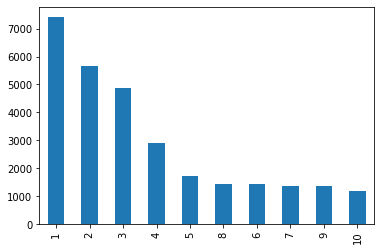

In [8]:
df_data.tags.map(lambda x : len(x)).value_counts().plot.bar()

In [9]:
df_data

,tags,id,plylst_title,songs,like_cnt,updt_date,len,tag_len,songs2,song2_len
1,"[까페, 잔잔한]",76951,"편하게, 잔잔하게 들을 수 있는 곡.-","[83116, 276692, 166267, 186301, 354465, 256598...",17,2017-08-28 07:09:34.000,28,2,"[83116, 276692, 166267, 354465, 256598, 666852...",25
2,"[운동, 드라이브, Pop, 트로피컬하우스, 힐링, 기분전환, 2017, 팝, 트렌...",69252,2017 Pop Trend,"[418694, 222305, 96545, 135950, 304687, 457451...",435,2017-09-15 15:59:26.000,30,10,"[418694, 222305, 96545, 135950, 304687, 457451...",22
3,"[잔잔한, 추억, 회상]",36557,멍청이.. 내맘도 몰라.,"[496913, 632529, 501426, 515574, 411161, 10341...",5,2008-09-23 22:32:02.000,20,3,"[632529, 501426, 515574, 411161, 103411, 17813...",17
5,"[우울, 힐링, 힘내]",112060,지친 너를 위로해줄 제목편지 준비해봤어,"[449808, 691770, 640657, 313395, 697100, 34090...",1,2018-01-04 22:49:29.000,21,3,"[691770, 640657, 313395, 697100, 340905, 22169...",15
6,[비오는날],75342,"이렇게 비 내리는 날이면, 너도 내 생각 할까..","[379674, 164522, 33196, 281228, 640012, 117969...",17,2016-10-12 16:22:17.000,18,1,"[164522, 33196, 640012, 117969, 75425, 627363,...",15
...,...,...,...,...,...,...,...,...,...,...
45430,"[겨울, 설렘, 사랑]",133185,첫눈처럼 설레였던 그날♥,"[334564, 221618, 504089, 321512, 476845, 11368...",154,2014-12-24 14:25:23.000,25,3,"[334564, 221618, 476845, 113687, 211159, 51275...",21
45434,[팝],33486,들을수록 걸크러쉬 물씬 느껴지는 음악리스트,"[619719, 374517, 323561, 79157, 170970, 241952...",4,2017-03-18 00:07:08.000,29,1,"[619719, 374517, 323561, 79157, 241952, 587512...",17
45435,[인디],153220,오후의 어쿠스틱 vol.2,"[627005, 253230, 643932, 22659, 316149, 247137...",39,2013-04-19 01:36:45.000,21,1,"[627005, 253230, 643932, 22659, 316149, 247137...",20
45436,[여친],79538,여자친구 명곡,"[65053, 389127, 443914, 498028, 375431, 312296...",6,2018-03-09 14:24:37.000,23,1,"[65053, 389127, 443914, 498028, 375431, 312296...",23


In [12]:
df_data

,tags,id,plylst_title,songs,like_cnt,updt_date,len,tag_len,songs2,song2_len
1,"[까페, 잔잔한]",76951,"편하게, 잔잔하게 들을 수 있는 곡.-","[83116, 276692, 166267, 186301, 354465, 256598...",17,2017-08-28 07:09:34.000,28,2,"[83116, 276692, 166267, 354465, 256598, 666852...",25
2,"[운동, 드라이브, Pop, 트로피컬하우스, 힐링, 기분전환, 2017, 팝, 트렌...",69252,2017 Pop Trend,"[418694, 222305, 96545, 135950, 304687, 457451...",435,2017-09-15 15:59:26.000,30,10,"[418694, 222305, 96545, 135950, 304687, 457451...",22
3,"[잔잔한, 추억, 회상]",36557,멍청이.. 내맘도 몰라.,"[496913, 632529, 501426, 515574, 411161, 10341...",5,2008-09-23 22:32:02.000,20,3,"[632529, 501426, 515574, 411161, 103411, 17813...",17
5,"[우울, 힐링, 힘내]",112060,지친 너를 위로해줄 제목편지 준비해봤어,"[449808, 691770, 640657, 313395, 697100, 34090...",1,2018-01-04 22:49:29.000,21,3,"[691770, 640657, 313395, 697100, 340905, 22169...",15
6,[비오는날],75342,"이렇게 비 내리는 날이면, 너도 내 생각 할까..","[379674, 164522, 33196, 281228, 640012, 117969...",17,2016-10-12 16:22:17.000,18,1,"[164522, 33196, 640012, 117969, 75425, 627363,...",15
...,...,...,...,...,...,...,...,...,...,...
45430,"[겨울, 설렘, 사랑]",133185,첫눈처럼 설레였던 그날♥,"[334564, 221618, 504089, 321512, 476845, 11368...",154,2014-12-24 14:25:23.000,25,3,"[334564, 221618, 476845, 113687, 211159, 51275...",21
45434,[팝],33486,들을수록 걸크러쉬 물씬 느껴지는 음악리스트,"[619719, 374517, 323561, 79157, 170970, 241952...",4,2017-03-18 00:07:08.000,29,1,"[619719, 374517, 323561, 79157, 241952, 587512...",17
45435,[인디],153220,오후의 어쿠스틱 vol.2,"[627005, 253230, 643932, 22659, 316149, 247137...",39,2013-04-19 01:36:45.000,21,1,"[627005, 253230, 643932, 22659, 316149, 247137...",20
45436,[여친],79538,여자친구 명곡,"[65053, 389127, 443914, 498028, 375431, 312296...",6,2018-03-09 14:24:37.000,23,1,"[65053, 389127, 443914, 498028, 375431, 312296...",23


In [13]:
tag_cnt=set()
for i in df_data['tags']:
    for j in i:
        tag_cnt.add(j)

In [65]:
list(tag_cnt)
tag_numbering = dict()
j=0
for i in tag_cnt:
    tag_numbering[i] = j
    j+=1

In [84]:
tag_numbering

{'힘든날': 0,
 '안녕': 1,
 '권태기': 2,
 '즐거운': 3,
 '모임': 4,
 '해외랩힙합': 5,
 '활기찬': 6,
 'Latin': 7,
 '모닝': 8,
 '힙합감성': 9,
 '독서': 10,
 '분위기있는': 11,
 '잠자기전': 12,
 '리듬': 13,
 '프로그레시브': 14,
 '기타': 15,
 '아카펠라': 16,
 'weiv': 17,
 '꿀잠': 18,
 '재즈힙합': 19,
 '시험기간': 20,
 '잔나비': 21,
 'Lofi': 22,
 'Best': 23,
 '프로듀스101': 24,
 '칠아웃': 25,
 '인디록': 26,
 '첫사랑': 27,
 '둠칫둠칫': 28,
 '생일': 29,
 'Coffee': 30,
 'SM': 31,
 '유산소': 32,
 '핫한': 33,
 '좋은음악': 34,
 '보이그룹': 35,
 '할로윈': 36,
 '멜로우': 37,
 '켄드릭라마': 38,
 '퓨전재즈': 39,
 '북유럽': 40,
 '트렌디': 41,
 '방학': 42,
 'disco': 43,
 'Chillout': 44,
 '감정': 45,
 '사이키델릭': 46,
 '작업': 47,
 'OfficialCharts': 48,
 '올림픽': 49,
 '비타민': 50,
 'PBRnB': 51,
 '나만알고싶은노래': 52,
 '아날로그': 53,
 '신인': 54,
 '팝뮤직': 55,
 '긴장감': 56,
 '크리스마스캐롤': 57,
 '보컬': 58,
 '소울풀': 59,
 '피아노': 60,
 'Musical': 61,
 '불토': 62,
 '캐롤': 63,
 '레트로': 64,
 'pub': 65,
 '낮잠': 66,
 '따뜻한': 67,
 '기차': 68,
 '몽롱한': 69,
 '세련': 70,
 '스웩': 71,
 '상큼한': 72,
 '로멘틱': 73,
 '보고싶다': 74,
 '가을감성': 75,
 '블랙뮤직': 76,
 '회상_추억': 77,
 '사무실': 78,
 '미스트롯': 79,

In [15]:
tag_cnt.isdisjoint({'설럼'})  ## 어떤 태그가 존재하는지 판단 True = 없음 // False = 있음
                            

True

In [18]:
tag_sim =dict()

In [19]:
type(tag_sim)

dict

In [76]:
tag_sim

{'까페': {'까페': 19434,
  '잔잔한': 2434,
  '설렘': 1668,
  '사랑': 2371,
  '가을': 1329,
  '힐링': 3540,
  '휴식': 3838,
  '밤': 1167,
  '새벽': 1037,
  '여름': 1033,
  '매장음악': 4175,
  '운동': 57,
  '재즈': 106,
  '시부야케이': 19,
  '일렉트로닉': 19,
  '기분전환': 2402,
  '추억': 558,
  '회상': 387,
  '두근두근': 54,
  '달달한': 74,
  '겨울': 1179,
  '연인': 109,
  '명상': 85,
  '쓸쓸': 46,
  '이별': 674,
  '감성': 895,
  '발라드': 947,
  '여성보컬': 19,
  '가창력': 19,
  '매장': 261,
  '비오는날': 1191,
  '피아노': 111,
  '커피': 873,
  '뉴에이지': 149,
  '드라이브': 627,
  'Jazz': 59,
  'Pop': 73,
  '조용한': 15,
  'cafe': 15,
  '슬픔': 384,
  '장마': 47,
  '카페': 1132,
  '여름향기': 54,
  '비': 164,
  '분위기': 289,
  '따뜻한': 110,
  '편안한': 123,
  '인디뮤직': 15,
  '봄': 796,
  '빌보드': 16,
  'Billboard': 16,
  '팝': 16,
  '집중': 112,
  'RnB': 25,
  'soul': 25,
  '트렌드': 25,
  '트렌디': 25,
  '팝송': 22,
  '달달': 67,
  '어쿠스틱': 279,
  '스트레스': 245,
  '여행': 479,
  '산책': 433,
  '퇴근': 45,
  '연주곡': 144,
  '운전': 56,
  '연애': 41,
  'OST': 26,
  '국내': 26,
  '드라마': 26,
  '감미로운': 49,
  '기분좋은': 71,
  '음색': 209,
  '목

In [20]:
df_data.reset_index(inplace=True)

In [80]:
tag_sim.clear()
for i in range(len(df_data)):
    for j in df_data.loc[i].tags:
        for k in df_data.loc[i].tags:
            if j not in tag_sim:
                tag_sim[j] = {tag_numbering[k] : df_data.loc[i].song2_len}
            else:
                if tag_numbering[k] in tag_sim[j]:
                    tag_sim[j][tag_numbering[k]] += df_data.loc[i].song2_len
                else:
                    tag_sim[j][tag_numbering[k]] = df_data.loc[i].song2_len

In [81]:
tag_sim # left : right = tag_number : similarity

{'까페': {1089: 19434,
  314: 2434,
  952: 1668,
  1240: 2371,
  1007: 1329,
  283: 3540,
  368: 3838,
  1080: 1167,
  1160: 1037,
  1363: 1033,
  512: 4175,
  481: 57,
  466: 106,
  813: 19,
  344: 19,
  345: 2402,
  991: 558,
  178: 387,
  939: 54,
  732: 74,
  1288: 1179,
  279: 109,
  115: 85,
  1182: 46,
  414: 674,
  499: 895,
  153: 947,
  1268: 19,
  120: 19,
  1312: 261,
  960: 1191,
  60: 111,
  583: 873,
  133: 149,
  210: 627,
  1207: 59,
  387: 73,
  1114: 15,
  944: 15,
  212: 384,
  1234: 47,
  641: 1132,
  235: 54,
  1330: 164,
  376: 289,
  67: 110,
  785: 123,
  725: 15,
  676: 796,
  1004: 16,
  163: 16,
  421: 16,
  1287: 112,
  190: 25,
  875: 25,
  498: 25,
  41: 25,
  223: 22,
  449: 67,
  1069: 279,
  196: 245,
  1021: 479,
  1201: 433,
  98: 45,
  1070: 144,
  241: 56,
  843: 41,
  1173: 26,
  519: 26,
  1291: 26,
  945: 49,
  1003: 71,
  1137: 209,
  1097: 26,
  1249: 23,
  1348: 115,
  1303: 34,
  834: 22,
  1372: 44,
  1192: 64,
  173: 42,
  117: 37,
  927: 12


#### 각 태그마다 같은 플레이리스트에 나온 곡의 개수(song2_len)만큼 유사도 증가시킴
#### Ex) df_data의 첫번째 플레이리스트 song2_len =25
#### ['까페','잔잔한'] --> {'까페' : {'까페' : 25, '잔잔한' : 25}} / {'잔잔한' : {'잔잔한' : 25, '카페' : 25}}

In [82]:
keys = tag_sim.keys()
tag_sim_sorted=dict()
for i in keys:
    tag_sim_sorted[i]=sorted(tag_sim[i].items(), key = (lambda x : x[1]),reverse = True)

In [109]:
tag_sim_sorted  ## 최종 태그 유사도(각 태그별로 유사도를 내림차순으로 정렬)

{'까페': [(1089, 19434),
  (512, 4175),
  (368, 3838),
  (283, 3540),
  (314, 2434),
  (345, 2402),
  (1240, 2371),
  (952, 1668),
  (1007, 1329),
  (960, 1191),
  (1288, 1179),
  (1080, 1167),
  (641, 1132),
  (1160, 1037),
  (1363, 1033),
  (153, 947),
  (499, 895),
  (583, 873),
  (676, 796),
  (414, 674),
  (210, 627),
  (991, 558),
  (1021, 479),
  (1201, 433),
  (178, 387),
  (212, 384),
  (376, 289),
  (1069, 279),
  (1312, 261),
  (196, 245),
  (1137, 209),
  (454, 175),
  (1330, 164),
  (133, 149),
  (1070, 144),
  (854, 128),
  (927, 126),
  (785, 123),
  (1348, 115),
  (1287, 112),
  (60, 111),
  (67, 110),
  (279, 109),
  (466, 106),
  (1023, 97),
  (806, 97),
  (115, 85),
  (148, 85),
  (732, 74),
  (387, 73),
  (1003, 71),
  (10, 71),
  (449, 67),
  (994, 67),
  (308, 67),
  (389, 65),
  (1192, 64),
  (1255, 64),
  (1207, 59),
  (481, 57),
  (241, 56),
  (1174, 56),
  (939, 54),
  (235, 54),
  (577, 50),
  (945, 49),
  (1234, 47),
  (1182, 46),
  (256, 46),
  (98, 45),
  (4

AttributeError: 'str' object has no attribute 'key'

In [28]:
cafe_distance=[]

tag_list_temp = list(tag_sim['까페'].values())
tag_list_temp.sort(reverse=True)
for i in tag_list_temp:
    cafe_distance.append(i/tag_list_temp[0])
cafe_distance = [1/i for i in cafe_distance]
len(cafe_distance)

172

In [86]:
tag_distance =[] #모든 태그의 거리 // 이중리스트
distance=[] #각 태그 하나의 거리
distance_inverse=[]

for tags in list(tag_sim.keys()):
    tag_list = list(tag_sim[tags].values())
    tag_list.sort(reverse=True)
    distance = [value/tag_list[0] for value in tag_list ]
    distance_inverse=[1/k for k in distance]
    tag_distance.append(distance_inverse)

tag_distance

[[1.0,
  4.654850299401198,
  5.0635747785304845,
  5.489830508474576,
  7.9843878389482335,
  8.09075770191507,
  8.196541543652467,
  11.65107913669065,
  14.623024830699773,
  16.317380352644836,
  16.483460559796438,
  16.652956298200515,
  17.1678445229682,
  18.74059787849566,
  18.813165537270088,
  20.521647307286166,
  21.713966480446928,
  22.261168384879728,
  24.41457286432161,
  28.833827893175076,
  30.995215311004785,
  34.82795698924731,
  40.57202505219207,
  44.88221709006929,
  50.21705426356589,
  50.609375,
  67.24567474048443,
  69.65591397849462,
  74.45977011494253,
  79.32244897959183,
  92.98564593301435,
  111.05142857142856,
  118.50000000000001,
  130.4295302013423,
  134.95833333333334,
  151.828125,
  154.23809523809524,
  158.0,
  168.9913043478261,
  173.51785714285717,
  175.0810810810811,
  176.67272727272726,
  178.29357798165137,
  183.33962264150944,
  200.35051546391753,
  200.35051546391753,
  228.63529411764708,
  228.63529411764708,
  262.62162

In [87]:
import math
for i in range(len(tag_distance)):
    for j in range(len(tag_distance[i])):
        tag_distance[i][j] = math.sqrt(tag_distance[i][j])


In [120]:
tag_distance[0]

[1.0,
 2.157510208411816,
 2.2502388269982556,
 2.3430387338826852,
 2.8256659107099398,
 2.8444257244503803,
 2.8629602762966284,
 3.413367711907208,
 3.8240063847618995,
 4.0394777326586215,
 4.059982827524821,
 4.080803388819476,
 4.143409770100973,
 4.32904121931123,
 4.337414614406846,
 4.53008248349698,
 4.65982472636546,
 4.718174263937241,
 4.9411104889813595,
 5.3697139489152566,
 5.567334668493065,
 5.901521582545243,
 6.36961733954184,
 6.699419160648876,
 7.0863992452843,
 7.114026637566098,
 8.200346013460921,
 8.346011860673014,
 8.629007481451302,
 8.906315117914469,
 9.64290650856962,
 10.538094162201652,
 10.885770528538622,
 11.420574862998022,
 11.617156852402973,
 12.321855582662865,
 12.419263071458598,
 12.569805089976535,
 12.999665547537218,
 13.172617702752069,
 13.231820777243058,
 13.291829342597175,
 13.3526618313223,
 13.540296253830986,
 14.154522791811724,
 14.154522791811724,
 15.120690927257494,
 15.120690927257494,
 16.205604636101103,
 16.316224381951

In [95]:
tag_distance_matrix = np.array

In [104]:
temp =[]
matrix_form=[]
for i in range(1382):
    temp.append(0)
for j in range(1382):
    matrix_form.append(temp)

In [154]:
# for i in list(tag_sim_sorted.keys()):
#     for j in range(len(tag_sim_sorted[i])):
#         for k in range(len(tag_distance[j])):
#             matrix_form[tag_numbering[i]][tag_sim_sorted[j][0]] = tag_distance[j]

KeyError: 0

In [160]:
tag_sim_sorted[0][0]

KeyError: 0

In [126]:
matrix_form[312][0]

3

In [32]:
pip install pyclustering

     |████████████████████████████████| 2.7 MB 2.1 MB/s eta 0:00:01
  Created wheel for pyclustering: filename=pyclustering-0.10.0.1-py3-none-any.whl size=2615590 sha256=63ba011ab703339a8df5e0de41552f98ef01dba9b050ffe082a85f43d73f52fa
  Stored in directory: /Users/joyoungmin/Library/Caches/pip/wheels/38/f5/c1/98785d678f868f99a6c7e0d8075cedc123fe35ed04f72c560e
Successfully built pyclustering
Note: you may need to restart the kernel to use updated packages.


In [34]:
from pyclustering.cluster.kmeans import kmeans
from pyclustering.utils.metric import type_metric, distance_metric
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer

jym_matrix = [[1,0.8], [0.8, 1]]

user_function = lambda point1, point2: jym_matrix[point1][point2]

metric = distance_metric(type_metric.USER_DEFINED, func=user_function)

# Prepare initial centers using K-Means++ method.
K = 10
initial_centers = kmeans_plusplus_initializer(sample, K).initialize()

# create K-Means algorithm with specific distance metric
kmeans_instance = kmeans(sample, start_centers, metric=metric)

# run cluster analysis and obtain results
kmeans_instance.process()
clusters = kmeans_instance.get_clusters()

NameError: name 'sample' is not defined

In [51]:
t=100
math.sqrt(t)

10.0